In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
import pmdarima as pm
import numpy as np


df = pd.read_csv('commodity-prices-2016.csv').dropna(axis = 1)
df["Date"] = pd.to_datetime(df["Date"])
df = df.set_index('Date')
df

,Beverage Price Index,Industrial Inputs Price Index,Agricultural Raw Materials Index,Metals Price Index,Crude Oil petroleum,Aluminum,Bananas,Barley,Beef,Coal,...,Sugar Free Market,Sugar U.S. import price,Sunflower oil,Tea,Tin,Uranium,Wheat,Wool coarse,Wool fine,Zinc
Date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,189.310021,81.889650,78.900146,84.049004,72.089306,2054.860107,401.960839,66.584538,136.359985,39.696626,...,17.299999,19.660000,566.926957,225.179901,16973.587904,40.000000,175.634750,553.120940,684.277366,773.821533
1980-02-01,190.387928,83.048367,75.715154,88.345232,69.839420,2131.008545,372.185964,66.584538,134.549988,40.258127,...,22.750000,24.689999,573.958609,233.094498,17090.213164,38.000000,172.695236,568.154805,722.567093,868.620361
1980-03-01,194.060355,75.228895,69.002475,79.726312,70.981533,1978.378906,422.913536,69.897836,118.000000,40.827570,...,19.630001,21.180000,535.284522,226.833298,17460.590400,35.000000,163.509323,552.745109,695.956860,740.752441
1980-04-01,186.137888,72.471253,67.877108,75.789658,70.400373,1932.455566,395.895579,69.897836,114.510010,41.405068,...,21.250000,22.669998,486.062957,221.806793,17041.712600,32.000000,156.528030,510.650280,688.130355,707.683105
1980-05-01,185.070241,69.588103,65.879671,72.266748,71.021190,1775.803711,444.968980,68.241187,110.500000,41.990735,...,30.939999,31.889999,502.763130,229.611206,17180.604736,32.000000,161.304703,524.932443,720.760976,701.069092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-10-01,174.342772,115.852355,112.924508,117.967173,88.288847,1516.488636,933.576092,123.550579,184.545455,56.050325,...,14.141818,25.038182,1059.053125,391.840000,15794.613636,36.955163,165.388254,884.877380,956.059067,1724.340909
2015-11-01,174.189364,109.299203,109.512921,109.144832,81.061215,1467.892857,932.320442,124.469171,177.071429,56.326531,...,14.888000,25.606000,1045.010913,353.773968,14745.285714,35.934567,157.741528,902.048320,1003.058056,1583.309524
2015-12-01,172.467981,106.886989,109.422638,105.055460,68.602763,1497.202381,932.320442,121.593580,167.108696,55.850893,...,15.000000,25.830909,1022.144112,343.490783,14691.690476,35.099756,163.793245,909.910775,1028.319875,1527.785714


In [43]:
df

,Beverage Price Index,Industrial Inputs Price Index,Agricultural Raw Materials Index,Metals Price Index,Crude Oil petroleum,Aluminum,Bananas,Barley,Beef,Coal,...,Sugar Free Market,Sugar U.S. import price,Sunflower oil,Tea,Tin,Uranium,Wheat,Wool coarse,Wool fine,Zinc
Date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,189.310021,81.889650,78.900146,84.049004,72.089306,2054.860107,401.960839,66.584538,136.359985,39.696626,...,17.299999,19.660000,566.926957,225.179901,16973.587904,40.000000,175.634750,553.120940,684.277366,773.821533
1980-02-01,190.387928,83.048367,75.715154,88.345232,69.839420,2131.008545,372.185964,66.584538,134.549988,40.258127,...,22.750000,24.689999,573.958609,233.094498,17090.213164,38.000000,172.695236,568.154805,722.567093,868.620361
1980-03-01,194.060355,75.228895,69.002475,79.726312,70.981533,1978.378906,422.913536,69.897836,118.000000,40.827570,...,19.630001,21.180000,535.284522,226.833298,17460.590400,35.000000,163.509323,552.745109,695.956860,740.752441
1980-04-01,186.137888,72.471253,67.877108,75.789658,70.400373,1932.455566,395.895579,69.897836,114.510010,41.405068,...,21.250000,22.669998,486.062957,221.806793,17041.712600,32.000000,156.528030,510.650280,688.130355,707.683105
1980-05-01,185.070241,69.588103,65.879671,72.266748,71.021190,1775.803711,444.968980,68.241187,110.500000,41.990735,...,30.939999,31.889999,502.763130,229.611206,17180.604736,32.000000,161.304703,524.932443,720.760976,701.069092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-10-01,174.342772,115.852355,112.924508,117.967173,88.288847,1516.488636,933.576092,123.550579,184.545455,56.050325,...,14.141818,25.038182,1059.053125,391.840000,15794.613636,36.955163,165.388254,884.877380,956.059067,1724.340909
2015-11-01,174.189364,109.299203,109.512921,109.144832,81.061215,1467.892857,932.320442,124.469171,177.071429,56.326531,...,14.888000,25.606000,1045.010913,353.773968,14745.285714,35.934567,157.741528,902.048320,1003.058056,1583.309524
2015-12-01,172.467981,106.886989,109.422638,105.055460,68.602763,1497.202381,932.320442,121.593580,167.108696,55.850893,...,15.000000,25.830909,1022.144112,343.490783,14691.690476,35.099756,163.793245,909.910775,1028.319875,1527.785714


In [5]:
df2 = df.iloc[:, :10]
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 434 entries, 1980-01-01 to 2016-02-01
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Beverage Price Index              434 non-null    float64
 1   Industrial Inputs Price Index     434 non-null    float64
 2   Agricultural Raw Materials Index  434 non-null    float64
 3   Metals Price Index                434 non-null    float64
 4   Crude Oil petroleum               434 non-null    float64
 5   Aluminum                          434 non-null    float64
 6   Bananas                           434 non-null    float64
 7   Barley                            434 non-null    float64
 8   Beef                              434 non-null    float64
 9   Coal                              434 non-null    float64
dtypes: float64(10)
memory usage: 37.3 KB


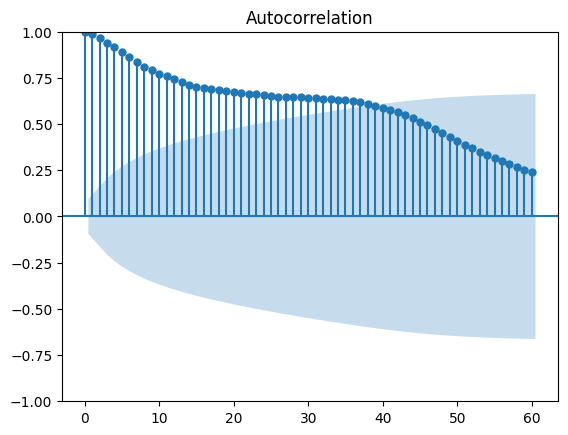

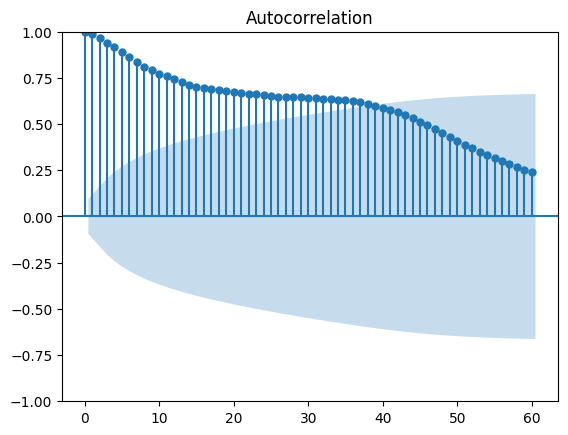

In [6]:
plot_acf(df2['Coal'], lags = 60)

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import autocorrelation_plot

# `data` is a time series data with datetime index

def autocorr_pd(data):
    fig, axes = plt.subplots(nrows=len(data.columns), ncols=1, figsize=(8, 2 * len(data.columns)))

    # Iterate over each column and plot autocorrelation
    for i, column in enumerate(data.columns):
        autocorrelation_plot(data[column], ax=axes[i])
        axes[i].set_title(column + ' column' + str(i))
        axes[i].set_xlabel('Lag')
        axes[i].set_ylabel('Autocorrelation')

    plt.tight_layout()
    plt.show()
    return

#autocorr_plot(df2)


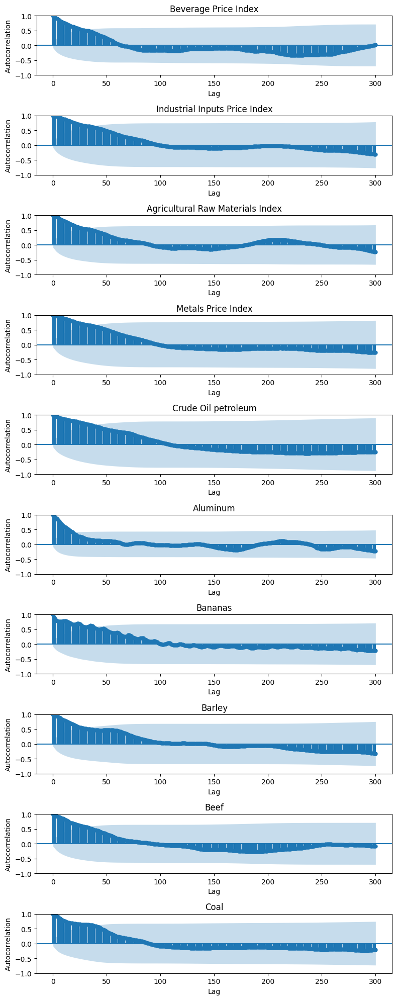

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# `data` is a time series data with datetime index

def autocorr_plot(data, lags=300):
    fig, axes = plt.subplots(nrows=len(data.columns), ncols=1, figsize=(8, 2 * len(data.columns)))

    # Iterate over each column and plot autocorrelation
    for i, column in enumerate(data.columns):
        ax = axes[i]
        plot_acf(data[column], lags=lags, ax=ax)
        ax.set_title(column)
        ax.set_xlabel('Lag')
        ax.set_ylabel('Autocorrelation')

    plt.tight_layout()
    plt.show()
    return

autocorr_plot(df2)

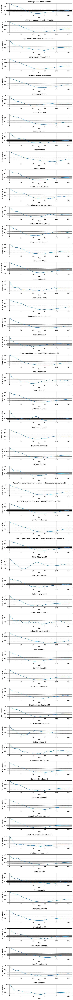

In [9]:
df3 = df2[df2.index >= '1995-01-01']
autocorr_pd(df[df.index >= '1995'])

In [10]:
columns_to_include = [0, 2, 5, 6, 7, 15, 22, 30, 31, 33, 39, 40, 52]
columns_to_include2 = [30, 31, 33, 39, 40, 52]
# Create df4 by selecting the specified columns from df2
df4 = df.iloc[:, columns_to_include].copy()#
#autocorr_plot(df4)
df5 = df.iloc[:, columns_to_include2].copy()


In [27]:
print (df5.columns)

Index(['Olive Oil', 'Oranges', 'Swine - pork', 'Soft Sawnwood', 'Shrimp',
       'Wool fine'],
      dtype='object')


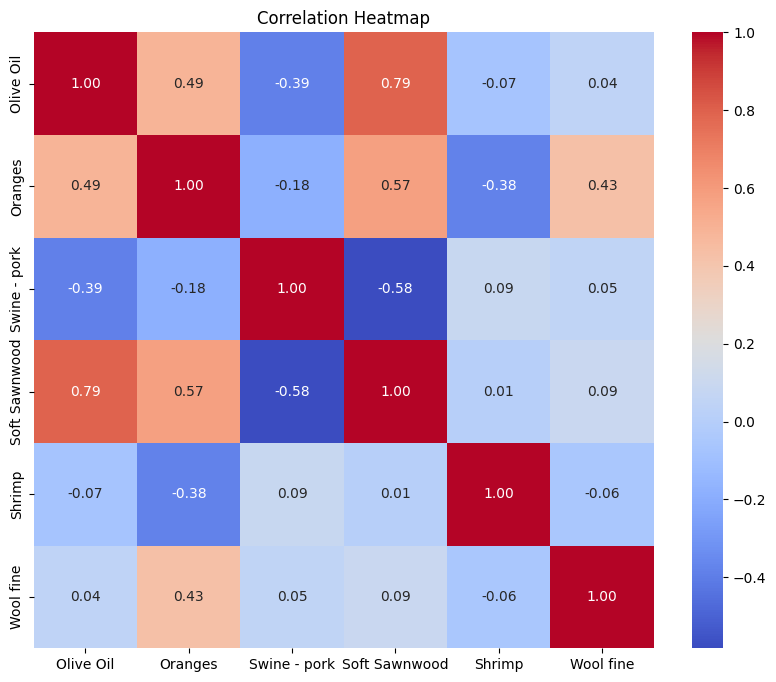

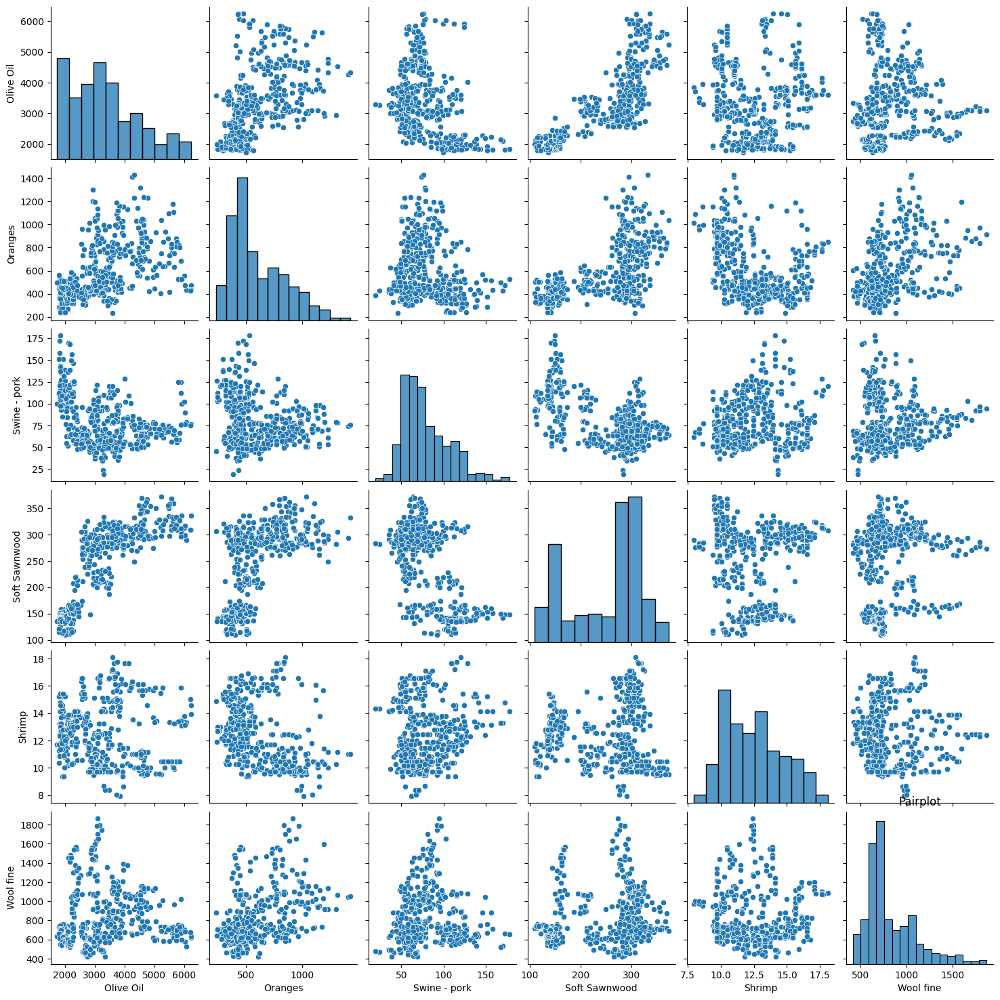

In [11]:
import seaborn as sns

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df5.corr(), annot=True, cmap='coolwarm', fmt = '.2f')
plt.title('Correlation Heatmap')
plt.show()

# Pairplot
sns.pairplot(df5)
plt.title('Pairplot')
plt.show()


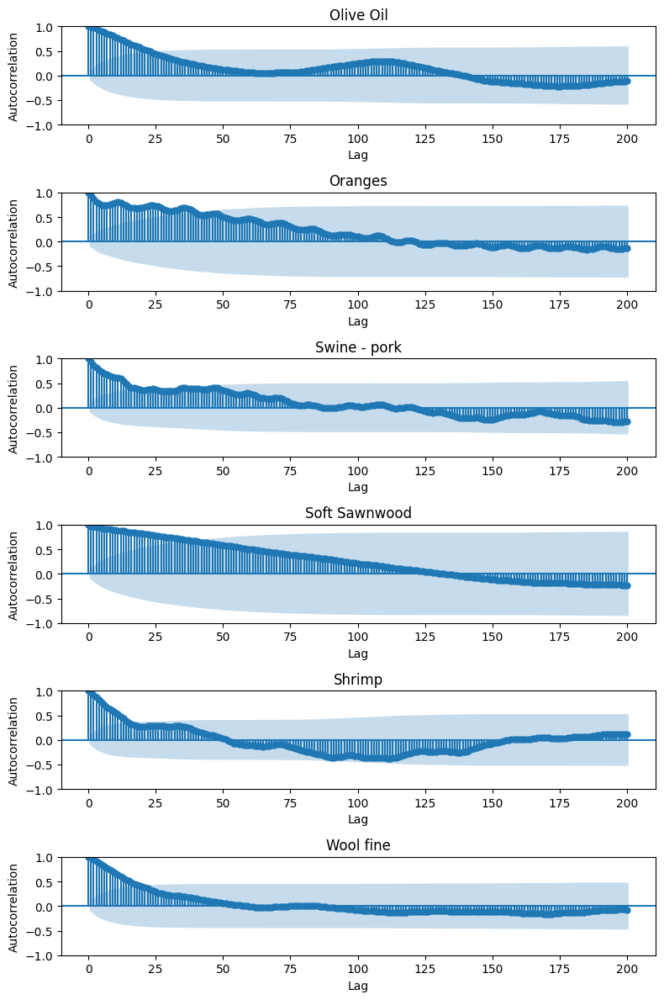

In [29]:
autocorr_plot(df5, 200)

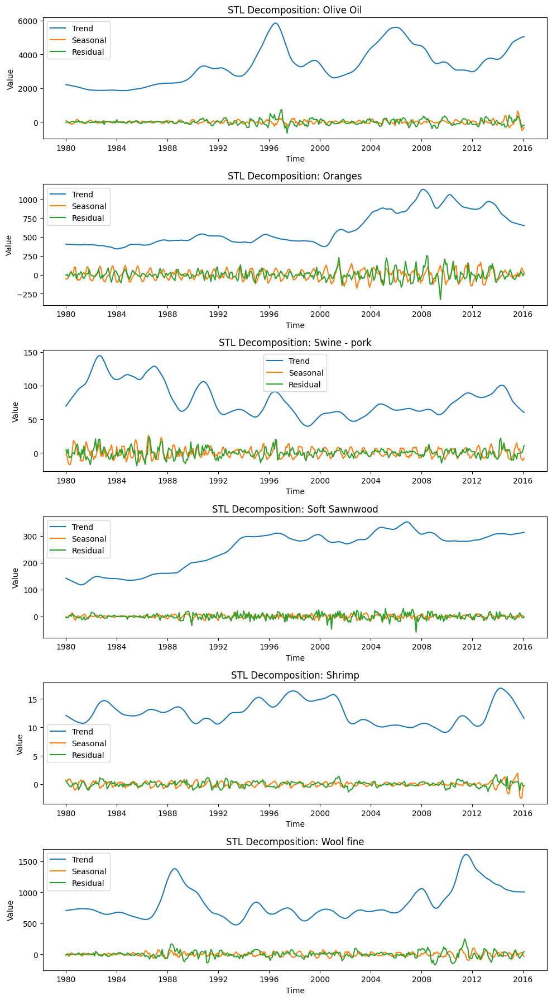

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

def STL_decomp(data, period = 12):
    trend_comp = pd.DataFrame()
    seas_comp = pd.DataFrame()
    res_comp = pd.DataFrame()
    
    # Specify the number of rows for the subplots
    n_rows = len(data.columns)

    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_rows, 1, figsize=(10, 3 * n_rows))

    # Iterate over each column and perform STL decomposition
    for i, column in enumerate(data.columns):
        ax = axs[i]
        decomposition = STL(data[column],period = period)
        result = decomposition.fit()
        
        ax.plot(data.index, result.trend, label='Trend')
        ax.plot(data.index, result.seasonal, label='Seasonal')
        ax.plot(data.index, result.resid, label='Residual')
        
        ax.set_title(f'STL Decomposition: {column}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Value')
        ax.legend()

        trend_comp[column + '_trend'] = result.trend
        seas_comp[column + '_seasonal'] = result.seasonal
        res_comp[column + '_residual'] = result.resid

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()
    
    return (trend_comp,seas_comp,res_comp)

trend_comp,seas_comp,res_comp = STL_decomp(df5)


In [36]:
detrended = pd.DataFrame(index=df5.index)

# Iterate over each column in df5
for column in df5.columns:
    # Extract the corresponding columns from seas_comp and res_comp
    seas_column = seas_comp[column + '_seasonal']
    res_column = res_comp[column + '_residual']
    
    # Combine the columns by adding them
    detrended[column+'_detrended'] = seas_column + res_column

# Print the resulting detrended DataFrame
detrended


,Olive Oil_detrended,Oranges_detrended,Swine - pork_detrended,Soft Sawnwood_detrended,Shrimp_detrended,Wool fine_detrended
Date,,,,,,
1980-01-01,55.206700,-57.328751,2.738730,-4.485991,1.245254,-21.768855
1980-02-01,51.842454,-53.673035,-6.382026,-9.352578,0.704685,13.900107
1980-03-01,-4.456297,-64.989817,-9.129499,-7.423154,0.933093,-15.297344
1980-04-01,-99.118365,-25.282416,-24.477739,6.376273,0.608056,-25.678275
1980-05-01,-123.235394,40.634134,-23.613387,8.329660,0.391440,4.433002
...,...,...,...,...,...,...
2015-10-01,212.485417,-3.080902,5.687440,18.527669,-3.281983,-52.465452
2015-11-01,-374.450284,108.448712,-7.070796,8.271872,-2.410707,-5.041967
2015-12-01,-825.338859,112.130583,-9.622663,-1.340865,-2.086998,20.665586


In [37]:
deseasoned = pd.DataFrame(index=df5.index)

# Iterate over each column in df5
for column in df5.columns:
    # Extract the corresponding columns from seas_comp and res_comp
    trend_column = trend_comp[column + '_trend']
    res_column = res_comp[column + '_residual']
    
    # Combine the columns by adding them
    deseasoned[column+'_deseasoned'] = seas_column + trend_column

# Print the resulting detrended DataFrame
deseasoned

,Olive Oil_deseasoned,Oranges_deseasoned,Swine - pork_deseasoned,Soft Sawnwood_deseasoned,Shrimp_deseasoned,Wool fine_deseasoned
Date,,,,,,
1980-01-01,2209.080300,396.892951,62.244013,135.054405,4.656897,698.610422
1980-02-01,2212.229611,411.261922,79.498709,148.172465,19.560761,716.255872
1980-03-01,2175.613307,386.033285,57.175040,121.697623,-5.102825,694.297673
1980-04-01,2146.425441,368.421620,42.475905,102.847055,-22.122982,679.947834
1980-05-01,2175.612311,409.401523,86.349697,142.590121,19.459398,724.163632
...,...,...,...,...,...,...
2015-10-01,4968.466109,673.686858,75.466168,320.353939,22.790687,1018.443127
2015-11-01,5015.239664,687.143071,91.204523,338.251854,39.651685,1035.199749
2015-12-01,5046.236595,687.307008,93.465699,342.628811,42.962195,1038.388235


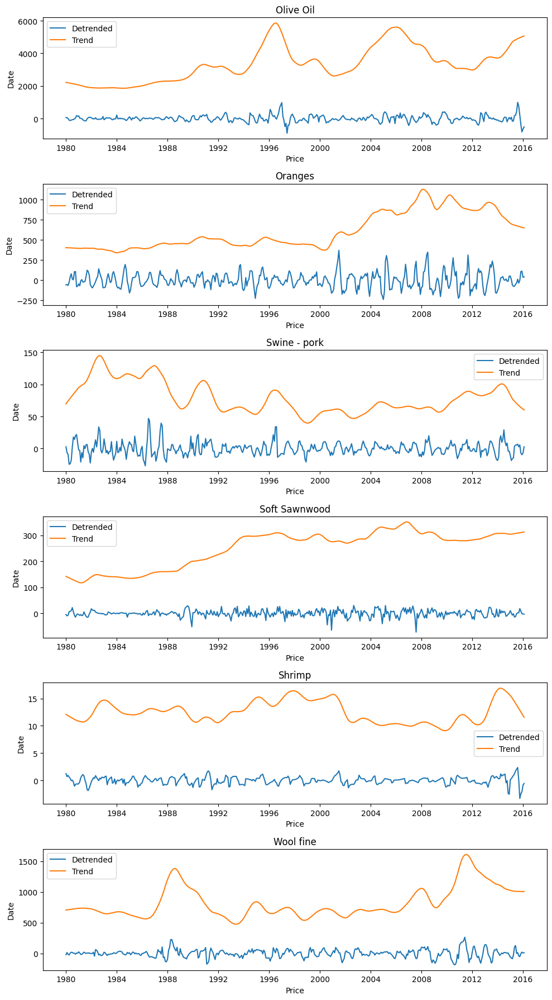

In [38]:
import matplotlib.pyplot as plt

# Specify the number of columns for the subplots
n_cols = len(df5.columns)

# Create a figure and axis objects for the subplots
fig, axs = plt.subplots(n_cols, 1, figsize=(10, 3 * n_cols))

# Iterate over each column and plot detrended and trend component
for i, column in enumerate(df5.columns):
    ax = axs[i]
    
    # Plot detrended data
    ax.plot(detrended[column+ '_detrended'].index, detrended[column+ '_detrended'], label='Detrended')
    
    # Plot trend component
    ax.plot(trend_comp[column + '_trend'].index, trend_comp[column + '_trend'], label='Trend')
    
    ax.set_title(f'{column}')
    ax.set_xlabel('Price')
    ax.set_ylabel('Date')
    ax.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


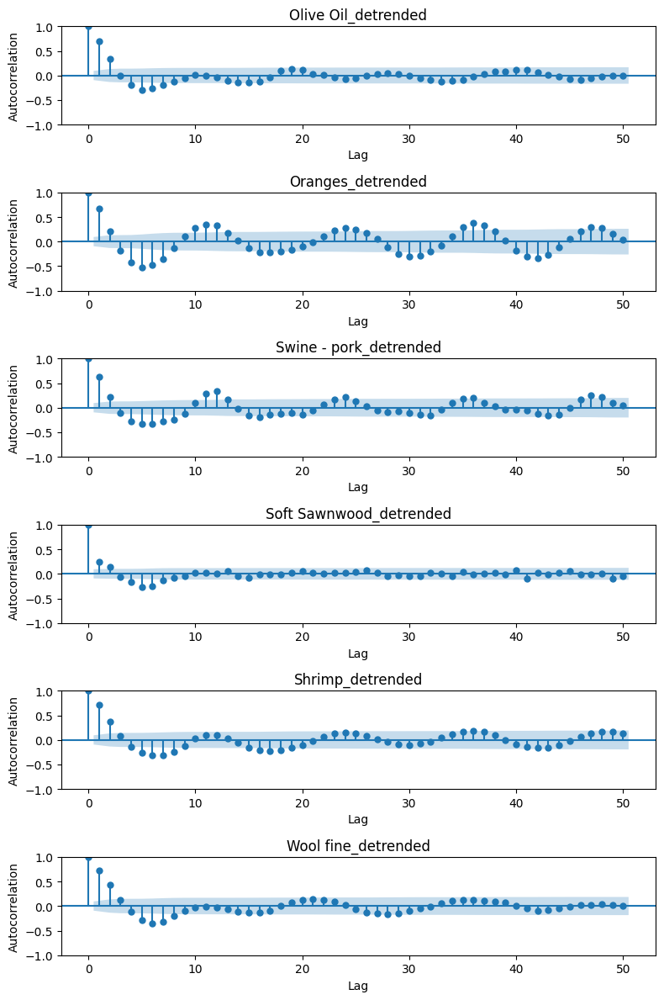

In [39]:
autocorr_plot(detrended,50)

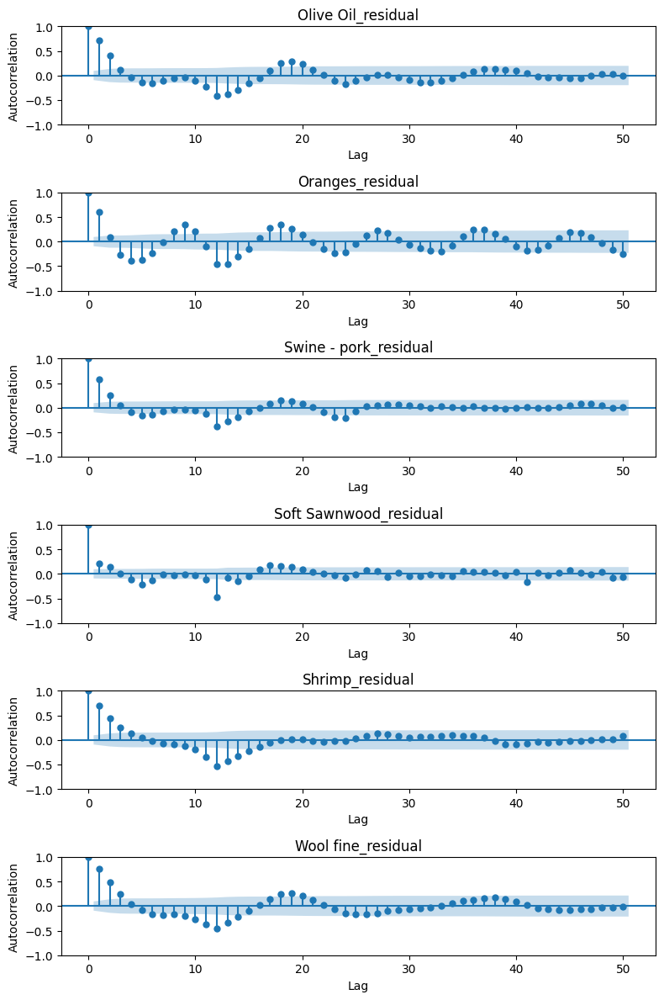

In [45]:
autocorr_plot(res_comp,50)

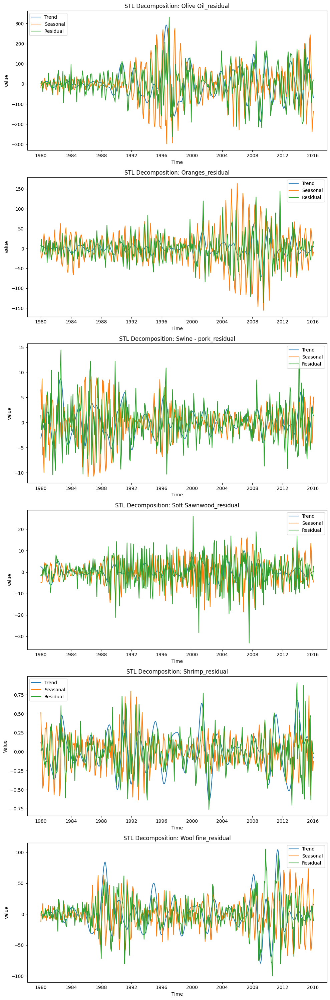

,Olive Oil_residual_trend,Oranges_residual_trend,Swine - pork_residual_trend,Soft Sawnwood_residual_trend,Shrimp_residual_trend,Wool fine_residual_trend
Date,,,,,,
1980-01-01,-10.752349,7.233085,-3.090991,2.549319,0.118185,-2.698903
1980-02-01,-7.897254,6.254930,-2.545970,2.316712,0.085256,-2.083029
1980-03-01,-5.083971,5.326060,-2.001974,2.055082,0.053700,-1.464144
1980-04-01,-2.349483,4.434300,-1.460078,1.762983,0.023745,-0.852039
1980-05-01,0.266625,3.567107,-0.919864,1.441163,-0.004490,-0.258627
...,...,...,...,...,...,...
2015-10-01,25.598135,-3.721174,0.056869,-0.356456,0.050899,6.063838
2015-11-01,2.891735,-1.702033,1.022156,-0.179818,0.019084,8.330932
2015-12-01,-20.710274,0.406141,2.030377,-0.015012,-0.013892,10.654964


In [48]:
orange_trend, orange_sea, orange_res = STL_decomp(res_comp, 9)

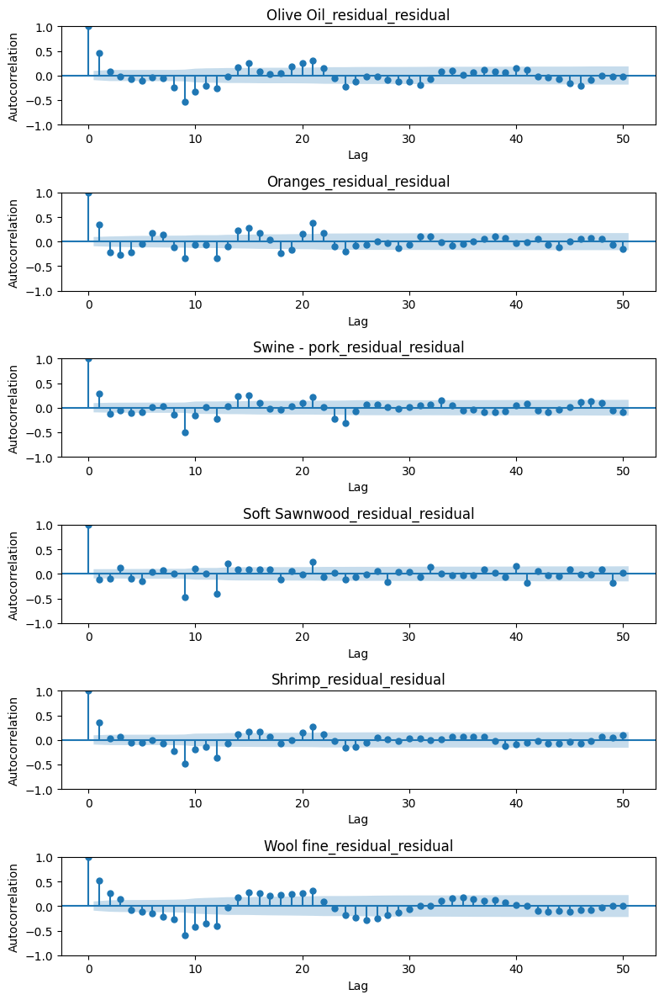

In [84]:
autocorr_plot(orange_res,50)

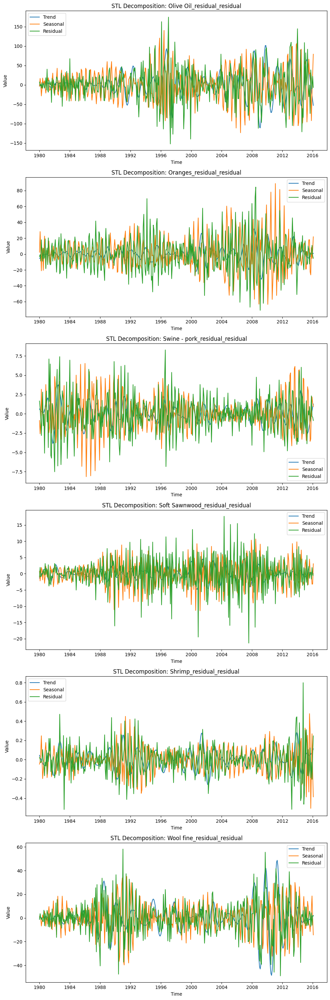

In [52]:
orange_trend2, orange_sea2, orange_res2 = STL_decomp(orange_res, 7)

In [62]:
df5.mean()

Olive Oil        3339.249160
Oranges           605.077659
Swine - pork       78.967719
Soft Sawnwood     250.487812
Shrimp             12.522673
Wool fine         823.871811
dtype: float64

In [59]:
res_comp.describe()

,Olive Oil_residual,Oranges_residual,Swine - pork_residual,Soft Sawnwood_residual,Shrimp_residual,Wool fine_residual
count,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000
mean,-0.653607,0.053378,0.068617,-0.053089,0.004132,0.051249
std,159.288721,63.882849,6.561693,10.445304,0.481388,53.940978
min,-664.496897,-327.486776,-19.394324,-58.344120,-1.372264,-167.312012
25%,-94.553724,-33.611783,-3.865267,-6.094325,-0.301961,-27.639766
50%,-3.597476,-3.417301,-0.015775,-0.357963,0.005358,-1.434839
75%,78.953107,29.318743,3.329358,5.791195,0.317714,22.961892
max,740.849639,254.767940,23.731511,29.795998,1.651095,251.558213


In [80]:
import numpy as np

res_comp_percentiles = res_comp.describe(percentiles=[0.25, 0.75])
range_25_75 = res_comp_percentiles.loc['75%'] - res_comp_percentiles.loc['25%']
range_25_75.index = [column.split('_')[0] for column in range_25_75.index]
matched_ratio = range_25_75 / df5.mean()
print(matched_ratio)


Olive Oil        0.051960
Oranges          0.104004
Swine - pork     0.091108
Soft Sawnwood    0.047449
Shrimp           0.049484
Wool fine        0.061419
dtype: float64


In [82]:
orange_res['Oranges_residual_residual']

Date
1980-01-01    -6.178255
1980-02-01    22.935079
1980-03-01    -8.445519
1980-04-01    -6.434357
1980-05-01     7.333952
                ...    
2015-10-01   -29.094234
2015-11-01     6.601506
2015-12-01     4.518640
2016-01-01     2.748232
2016-02-01    17.222575
Name: Oranges_residual_residual, Length: 434, dtype: float64

In [78]:
res_comp_percentiles = orange_res.describe(percentiles=[0.25, 0.75])
range_25_75 = res_comp_percentiles.loc['75%'] - res_comp_percentiles.loc['25%']
range_25_75.index = [column.split('_')[0] for column in range_25_75.index]
matched_ratio = range_25_75 / df5.mean()
print(matched_ratio)

Olive Oil        0.026371
Oranges          0.060716
Swine - pork     0.058113
Soft Sawnwood    0.031820
Shrimp           0.020498
Wool fine        0.031484
dtype: float64


In [79]:
res_comp_percentiles = orange_res2.describe(percentiles=[0.25, 0.75])
range_25_75 = res_comp_percentiles.loc['75%'] - res_comp_percentiles.loc['25%']
range_25_75.index = [column.split('_')[0] for column in range_25_75.index]
matched_ratio = range_25_75 / df5.mean()
print(matched_ratio)

Olive Oil        0.014192
Oranges          0.043089
Swine - pork     0.037377
Soft Sawnwood    0.021279
Shrimp           0.013548
Wool fine        0.018002
dtype: float64


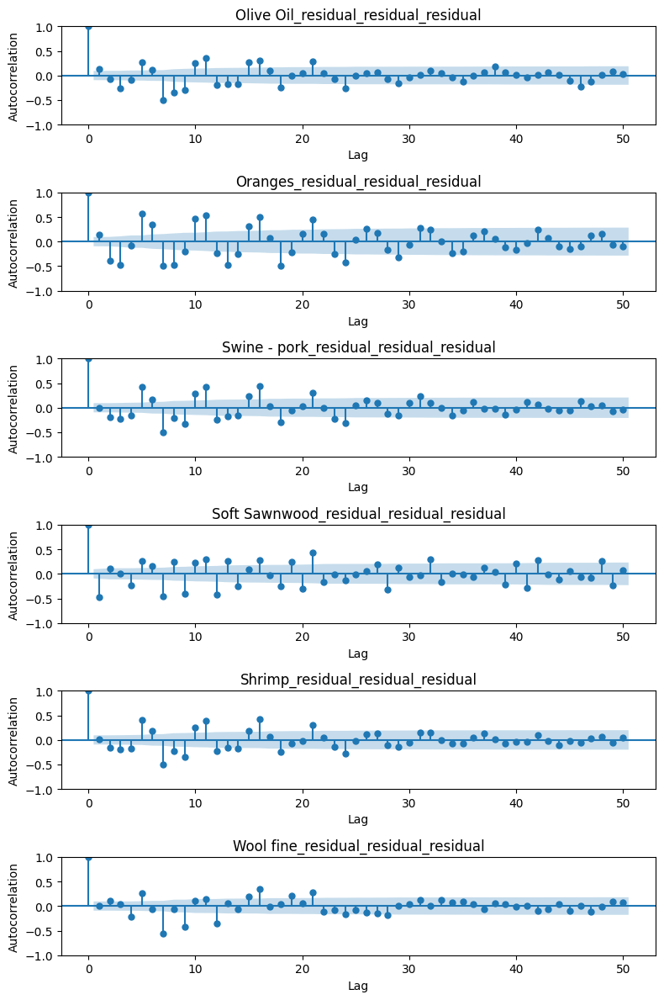

In [53]:
autocorr_plot(orange_res2,50)

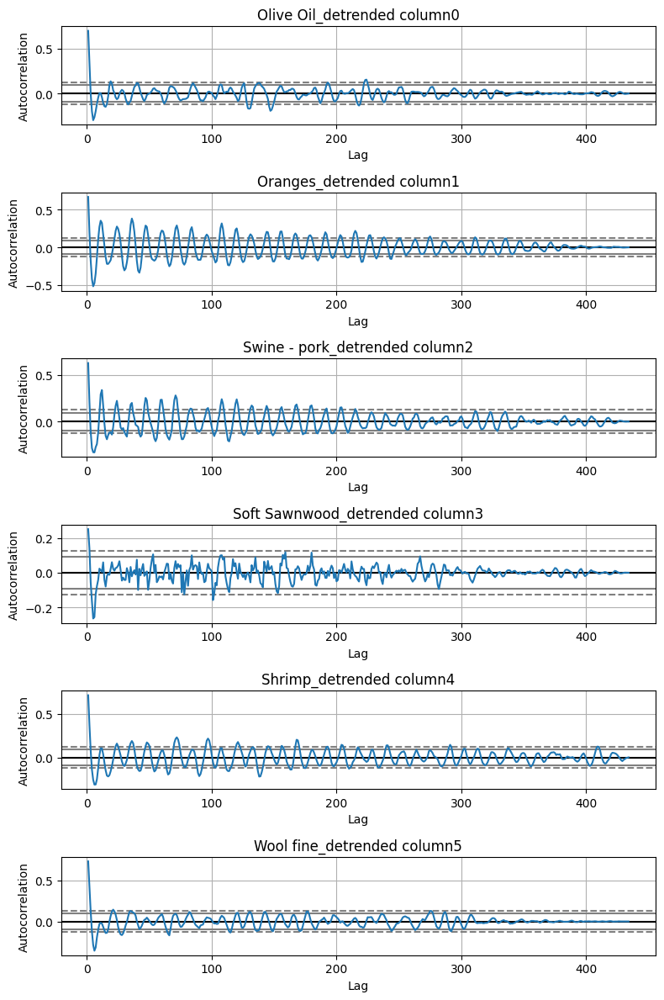

In [96]:
autocorr_pd(detrended)

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_percentage_error
import warnings
warnings.filterwarnings("ignore")

def exponential_smoothing(data, year = None, trend=None, damped=None, seasonal=None, seasonal_periods=None):
    if year != None:
        data = data[data.index >= year]
    n_cols = len(data.columns)
    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_cols, 1, figsize=(10, 3 * n_cols))

    # Iterate over each column
    for i, column in enumerate(data.columns):
        ax = axs[i]
        
        # Perform train-test split
        train_data, test_data = train_test_split(data[column], test_size=0.2, shuffle=False)
        
        # Fit exponential smoothing model
        model_args = {}
        if trend is not None:
            model_args['trend'] = trend
        if damped is not None:
            model_args['damped'] = damped
        if seasonal is not None:
            model_args['seasonal'] = seasonal
        if seasonal_periods is not None:
            model_args['seasonal_periods'] = seasonal_periods
        model = ExponentialSmoothing(train_data, **model_args)
        model_fit = model.fit()
        
        # Predict on test data
        y_pred = model_fit.predict(start=test_data.index[0], end=test_data.index[-1])
        
        # Compute MAPE
        mape = mean_absolute_percentage_error(test_data, y_pred)
        
        # Plot actual and predicted data
        ax.plot(data.index, data[column], label='Actual')
        ax.plot(test_data.index, y_pred, label='Predicted')
        
        ax.set_title(f'{column} (MAPE: {mape:.3f})')
        ax.set_xlabel('Time')
        ax.set_ylabel('Value')
        ax.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()

#exponential_smoothing(detrended)                                                        

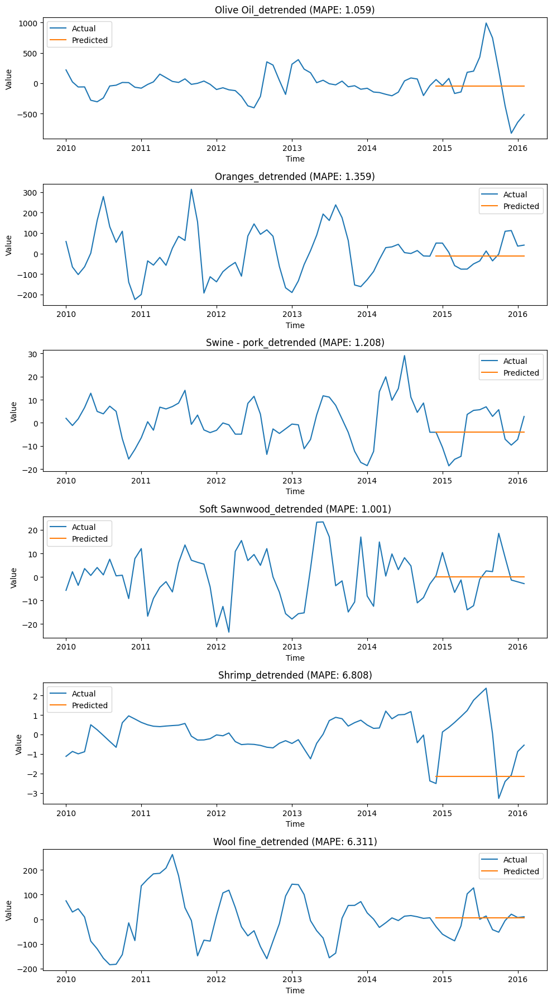

In [97]:
exponential_smoothing(detrended,'2010')

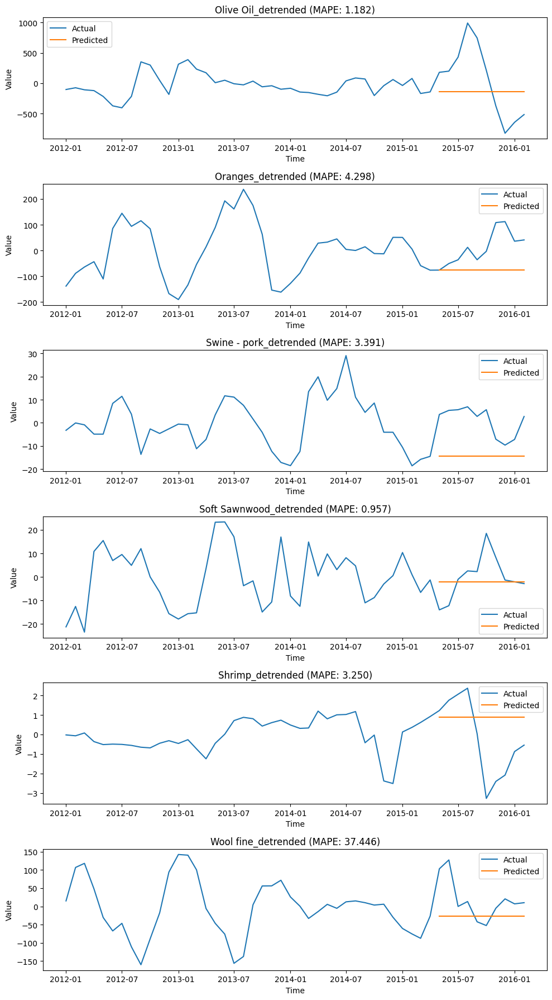

In [100]:
exponential_smoothing(detrended,'2012')

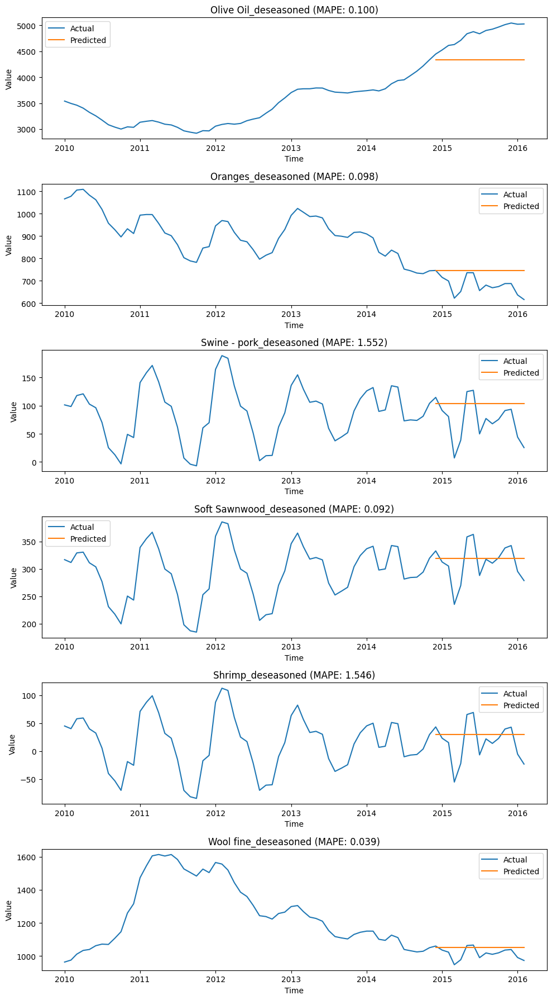

In [101]:
exponential_smoothing(deseasoned,'2010')

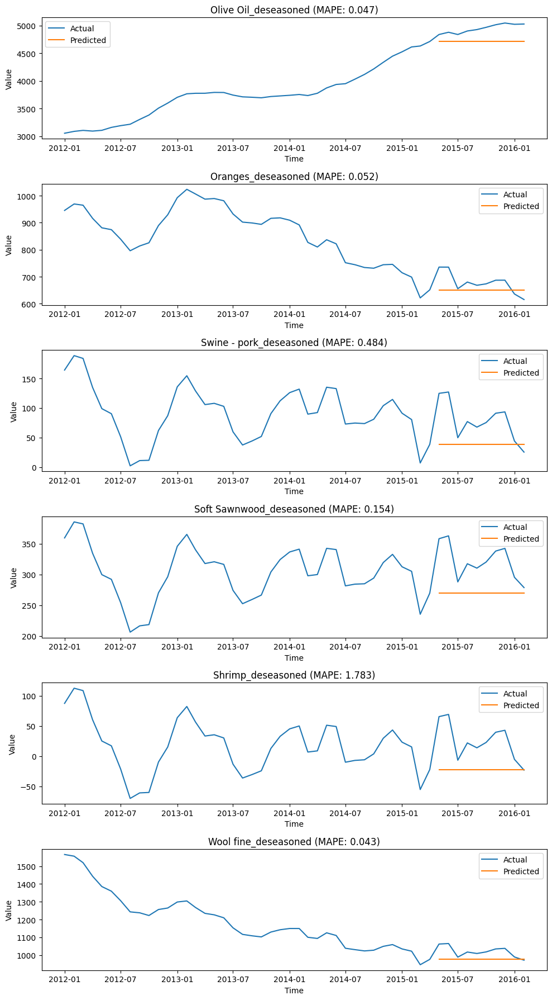

In [102]:
exponential_smoothing(deseasoned,'2012')

In [2]:
#exponential_smoothing(df5, '2010', trend = 'add', damped = True)

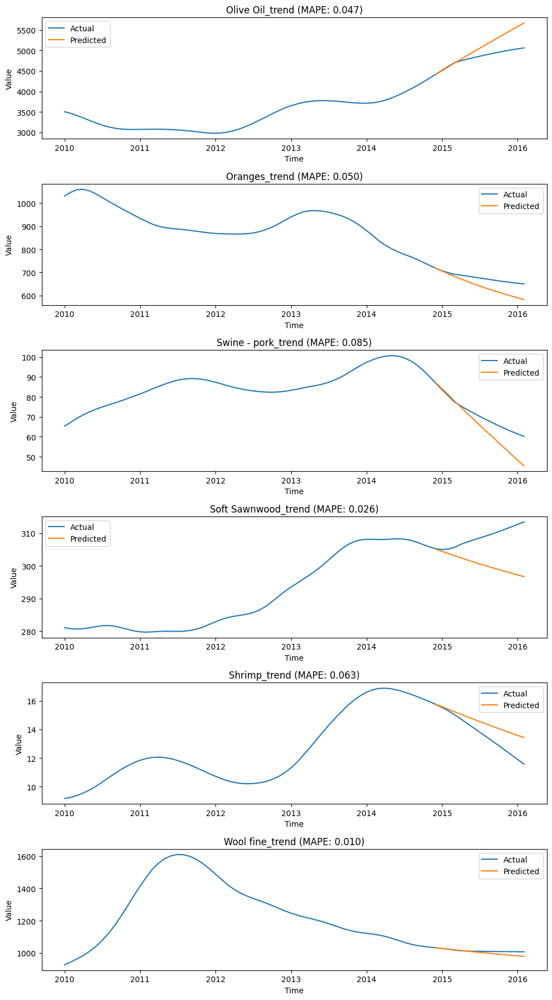

In [87]:
exponential_smoothing(trend_comp, '2010', trend = 'add', damped = True)

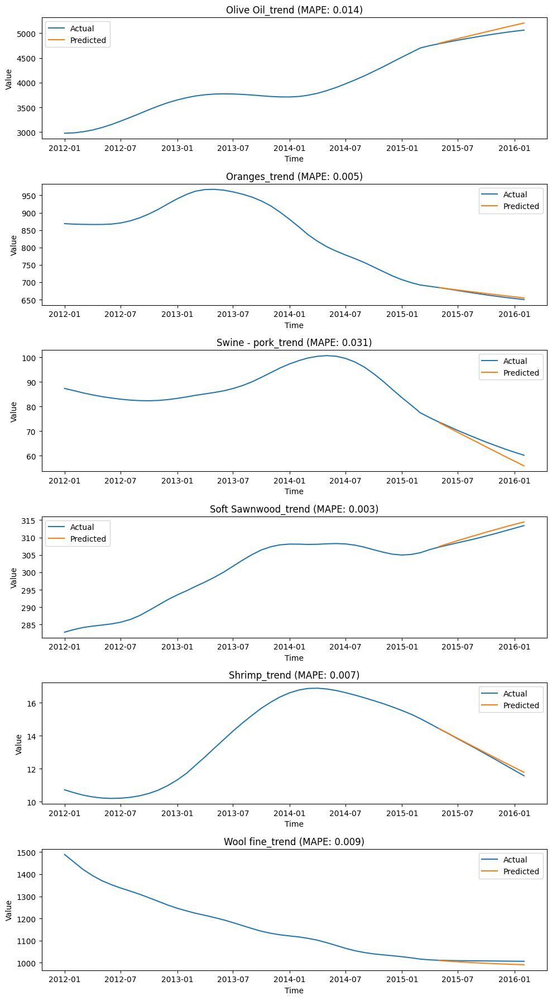

In [107]:
exponential_smoothing(trend_comp, '2012', trend = 'add', damped = True)

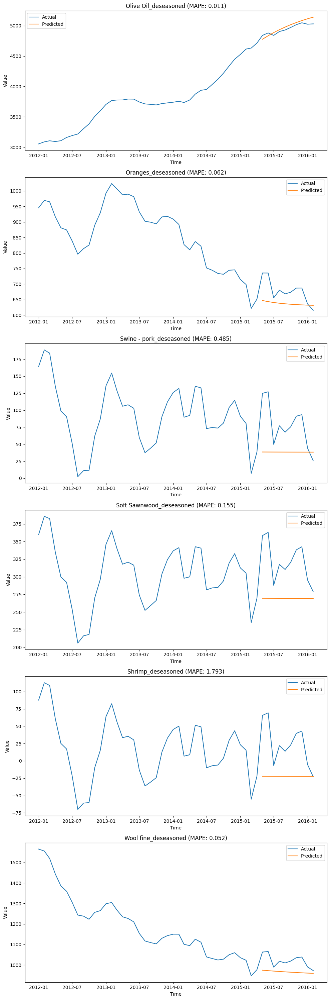

In [25]:
exponential_smoothing(deseasoned, '2012', trend = 'add', damped = True)

In [1]:
def exponential_smoothing_trend(data, year=None, trend_smoothing_factor=0.2):
    #data is the extracted trend component for each commodity
    if year is not None:
        data = data[data.index >= year]
    n_cols = len(data.columns)
    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_cols, 1, figsize=(10, 5 * n_cols))

    # Iterate over each column
    for i, column in enumerate(data.columns):
        ax = axs[i]
        # Perform train-test split
        train_data, test_data = train_test_split(data[column], test_size=0.2, shuffle=False)
        # Apply exponential smoothing to the trend component
        smoothed_trend = data[column].ewm(alpha=trend_smoothing_factor, adjust=False).mean()
        # Predict on test data by repeating the last smoothed trend value
        y_pred = [smoothed_trend.iloc[-1]] * len(test_data)

        # Compute MAPE
        mape = mean_absolute_percentage_error(test_data, y_pred)
        # Plot actual and predicted data
        ax.plot(data.index, data[column], label='Actual')
        ax.plot(test_data.index, y_pred, label='Predicted')

        ax.set_title(f'{column} (Trend Smoothing Factor: {trend_smoothing_factor}, MAPE: {mape:.2f})')
        ax.set_xlabel('Time')
        ax.set_ylabel('Value')
        ax.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()

#exponential_smoothing_trend(trend_comp, year='2000', trend_smoothing_factor=0.4)

In [89]:
import pmdarima as pm
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX


def arima_model(data, year=None, seasonal=False, seasonal_period=12):
    if year is not None:
        data = data[data.index >= year]
    n_cols = len(data.columns)
    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_cols, 1, figsize=(10, 3 * n_cols))
    # Iterate over each column
    for i, column in enumerate(data.columns):
        ax = axs[i]
        # Perform train-test split
        train_data, test_data = train_test_split(data[column], test_size=0.2, shuffle=False)
        
        # Determine the order of ARIMA using auto_arima
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore")
            if seasonal:
                model_order = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, trace=True, error_action='ignore').order
                seasonal_order = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, trace=True, error_action='ignore').seasonal_order
            else:
                model_order = auto_arima(train_data).order
                seasonal_order = None

        # Fit ARIMA model
        if seasonal:
            model = SARIMAX(train_data, order=model_order, seasonal_order=seasonal_order)
        else:
            model = ARIMA(train_data, order=model_order)
        model_fit = model.fit()

        # Predict on test data
        y_pred = model_fit.forecast(len(test_data))

        # Compute MAPE
        mape = mean_absolute_percentage_error(test_data, y_pred)
        
        # Plot actual and predicted data
        ax.plot(data.index, data[column], label='Actual')
        ax.plot(test_data.index, y_pred, label='Predicted')

        ax.set_title(f'{column} (ARIMA Order: {model_order}, MAPE: {mape:.3f})')
        ax.set_xlabel('Date')
        ax.set_ylabel('Price')
        ax.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()

#arima_model(trend_comp)

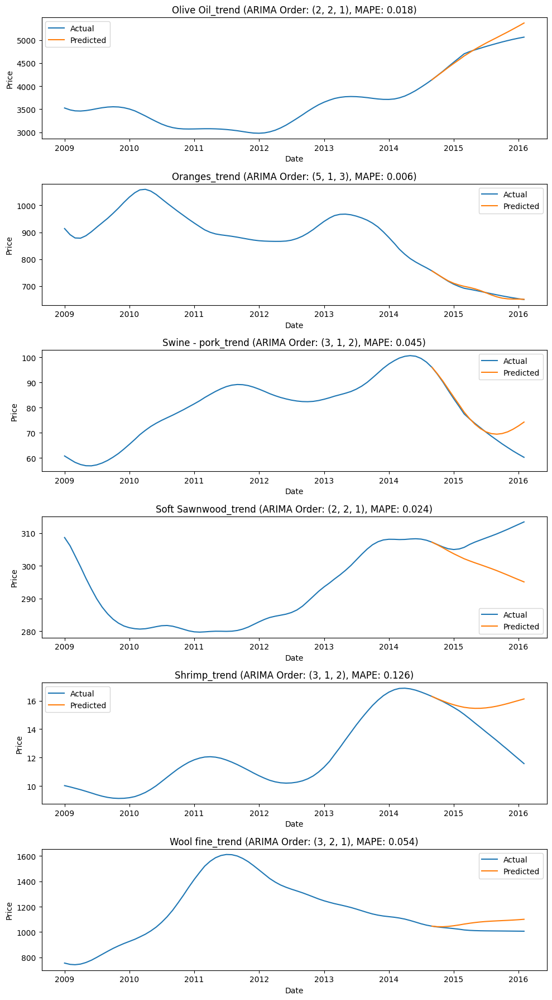

In [90]:
arima_model(trend_comp,'2009')

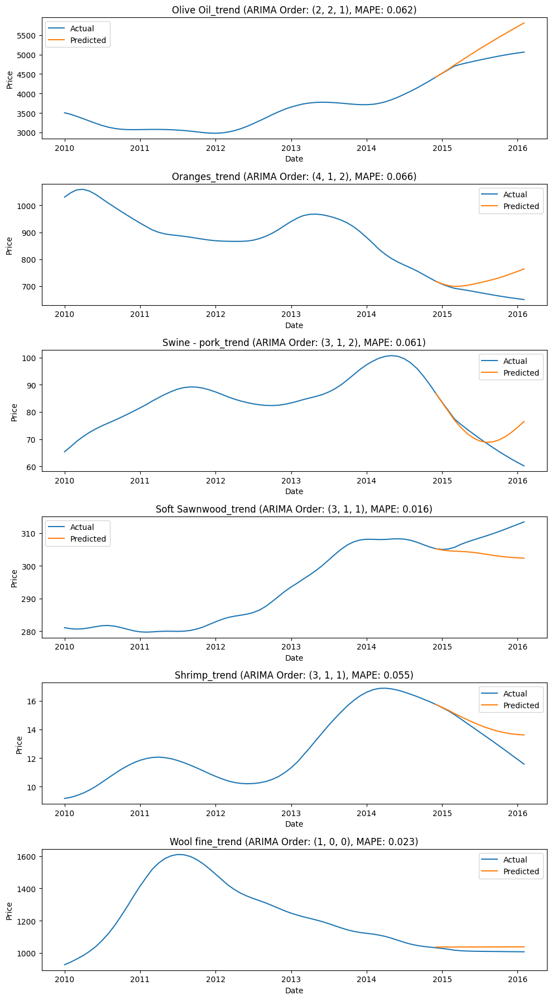

In [91]:
arima_model(trend_comp,'2010')

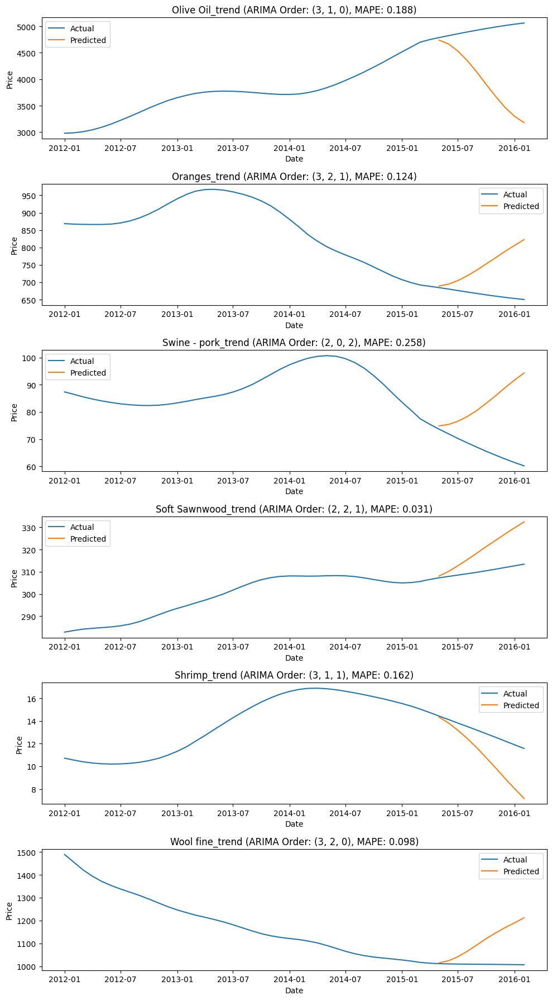

In [92]:
arima_model(trend_comp,'2012')

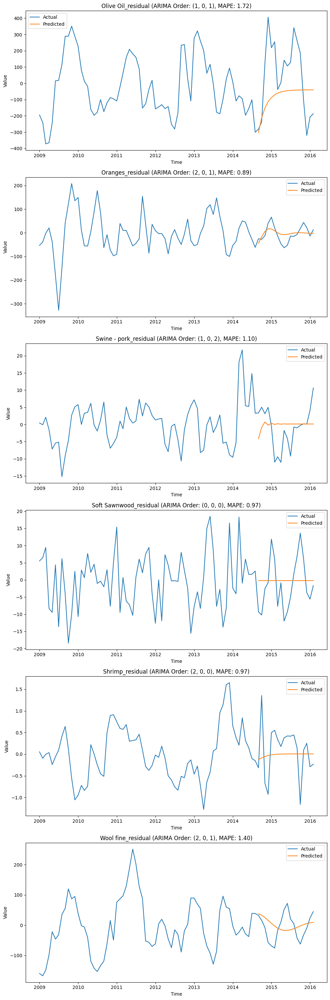

In [161]:
arima_model(res_comp,'2009')

In [162]:
res_comp.describe()

,Olive Oil_residual,Oranges_residual,Swine - pork_residual,Soft Sawnwood_residual,Shrimp_residual,Wool fine_residual
count,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000
mean,-0.653607,0.053378,0.068617,-0.053089,0.004132,0.051249
std,159.288721,63.882849,6.561693,10.445304,0.481388,53.940978
min,-664.496897,-327.486776,-19.394324,-58.344120,-1.372264,-167.312012
25%,-94.553724,-33.611783,-3.865267,-6.094325,-0.301961,-27.639766
50%,-3.597476,-3.417301,-0.015775,-0.357963,0.005358,-1.434839
75%,78.953107,29.318743,3.329358,5.791195,0.317714,22.961892
max,740.849639,254.767940,23.731511,29.795998,1.651095,251.558213


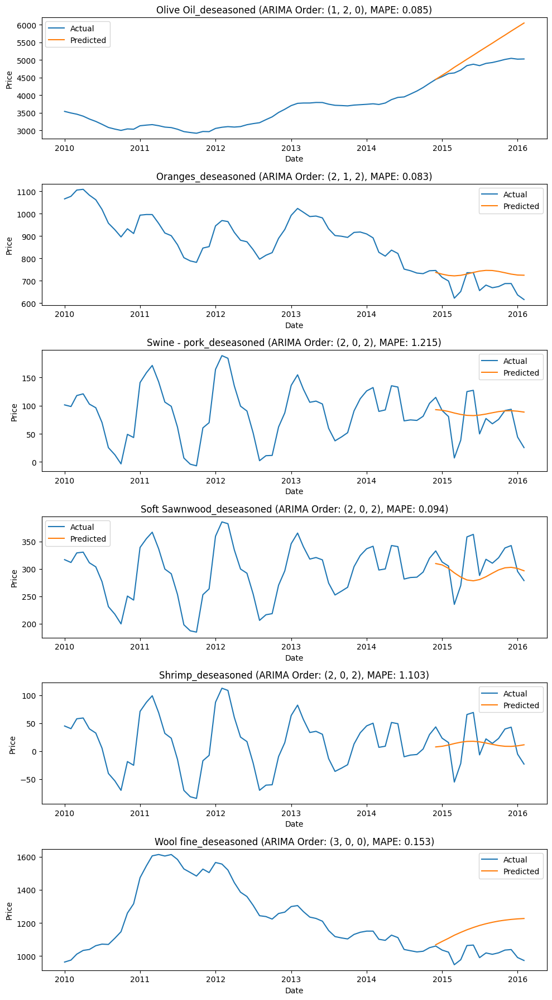

In [96]:
arima_model(deseasoned,'2010')

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=818.551, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=730.178, Time=1.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=816.566, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=786.861, Time=0.23 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=718.522, Time=1.93 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.83 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=765.987, Time=3.21 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=695.572, Time=2.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=713.659, Time=2.04 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.30 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=696.283, Time=

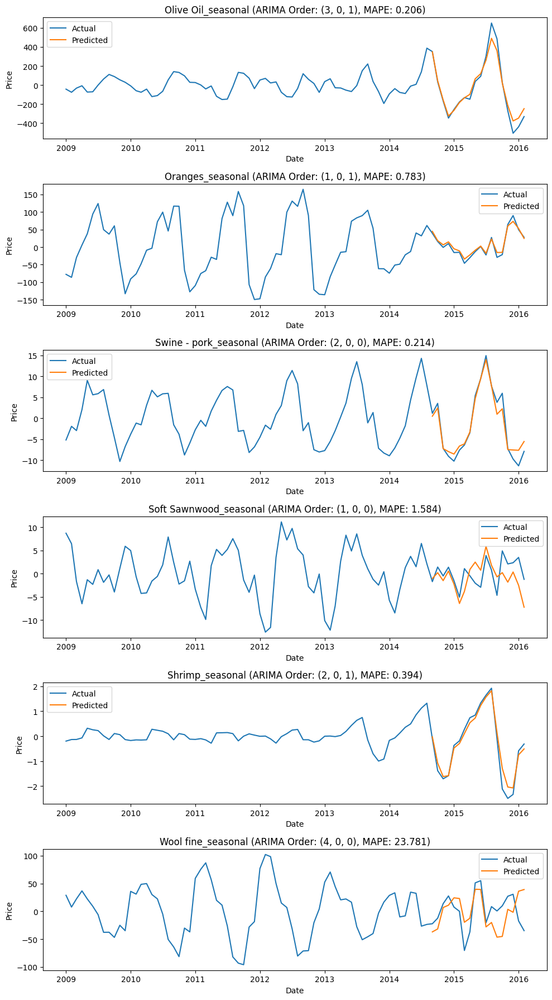

In [93]:
arima_model(seas_comp,'2009',seasonal = True, seasonal_period = 12)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=4.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=513.270, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.393, Time=0.89 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=511.726, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=489.127, Time=0.27 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.30 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=498.181, Time=0.64 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=448.687, Time=1.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=474.326, Time=0.44 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=3.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.61 sec

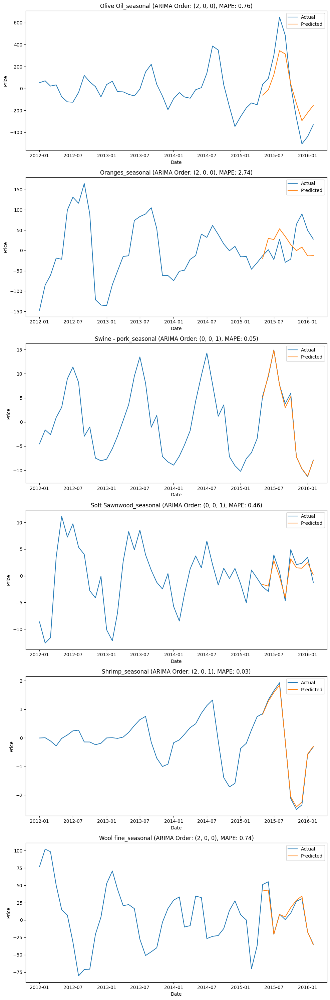

In [22]:
arima_model(seas_comp,'2012',seasonal = True, seasonal_period = 12)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=728.060, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=654.315, Time=1.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=726.156, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=701.108, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=640.716, Time=1.28 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=681.690, Time=2.55 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=613.574, Time=2.90 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=629.606, Time=0.59 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.46 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=614.679, Time=

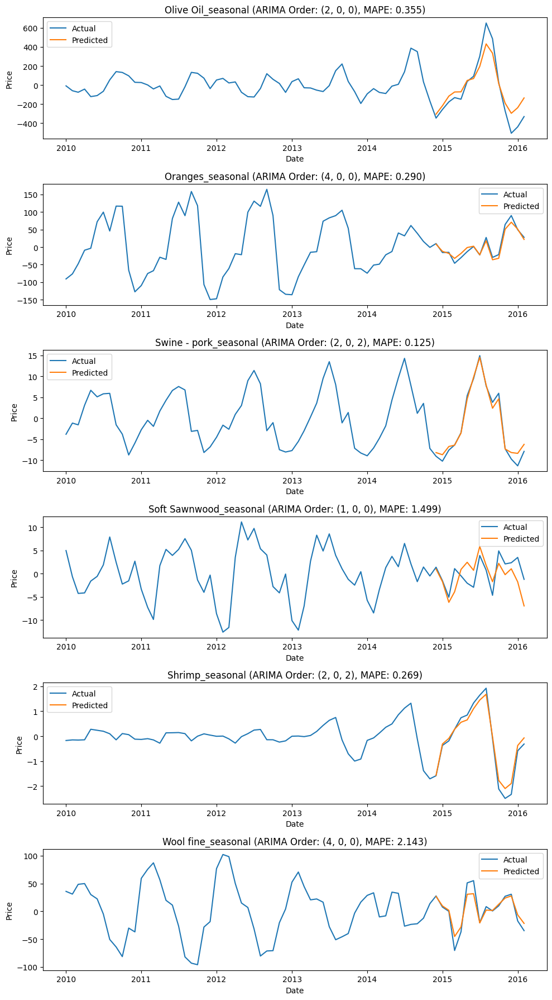

In [94]:
arima_model(seas_comp,'2010',seasonal = True, seasonal_period = 12)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=513.270, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.393, Time=1.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=511.726, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=489.127, Time=0.16 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=498.181, Time=0.57 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=448.687, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=474.326, Time=0.26 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.99 sec

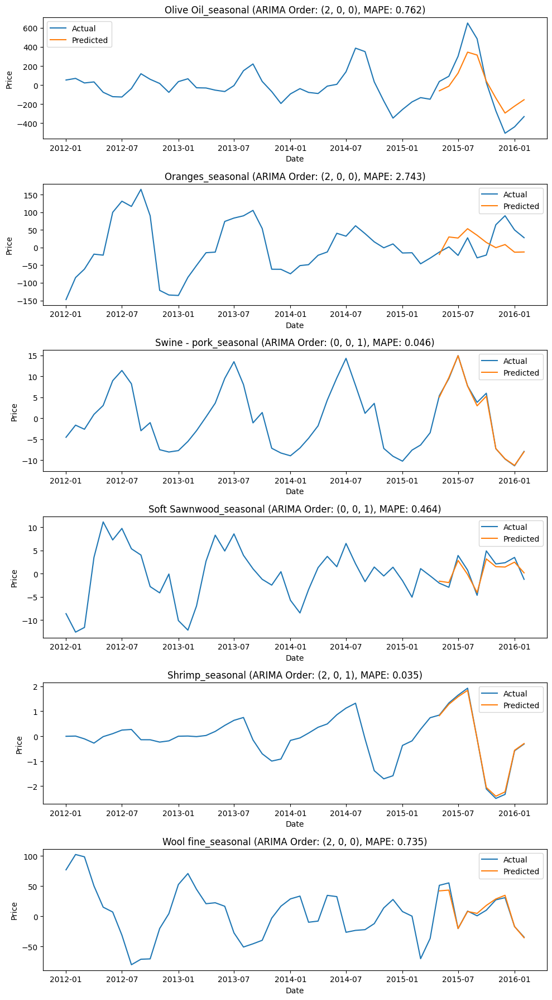

In [95]:
arima_model(seas_comp,'2012',seasonal = True, seasonal_period = 12)

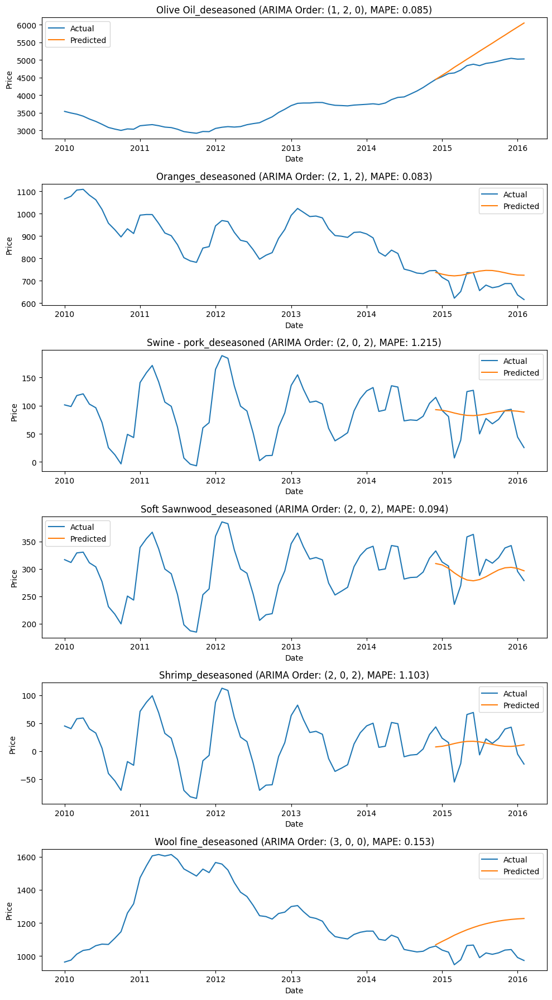

In [103]:
arima_model(deseasoned,'2010')

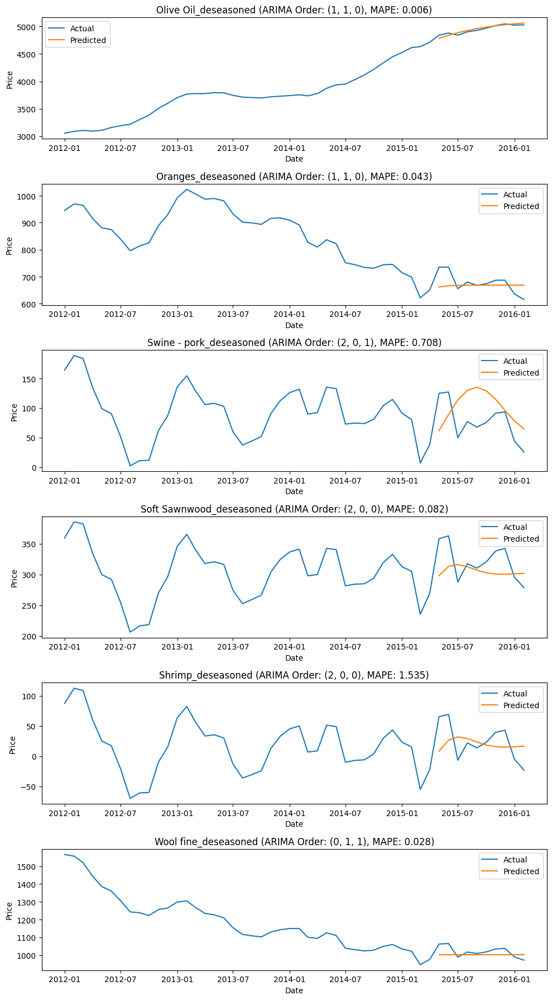

In [104]:
arima_model(deseasoned,'2012')

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=532.040, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.877, Time=0.78 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=519.114, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=531.435, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=517.333, Time=0.31 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=519.116, Time=0.53 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=521.114, Time=1.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=517.698, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=516.341, Time=0.22 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=518.331, Time=0.40 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=518.329, Time=0.61 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=520.329, Time=0.67 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=518.212, Time=0.29 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   

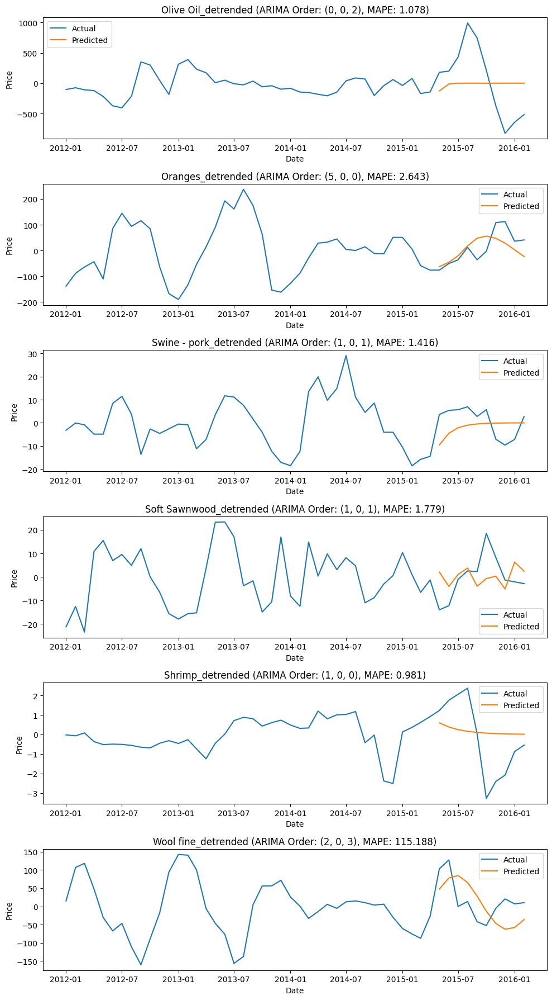

In [105]:
arima_model(detrended,'2012',seasonal = True, seasonal_period = 12)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=744.711, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=771.634, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=748.951, Time=0.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=747.307, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=771.471, Time=0.03 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=743.037, Time=1.00 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=741.138, Time=0.69 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=743.004, Time=1.40 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=739.770, Time=0.58 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=741.747, Time=1.34 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=741.751, Time=0.95 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=743.546, Time=1.22 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=738.220, Time=0.47 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=740.220, Time=0.80 sec
 ARIMA(0,0,2)(0,0,1)[12] intercep

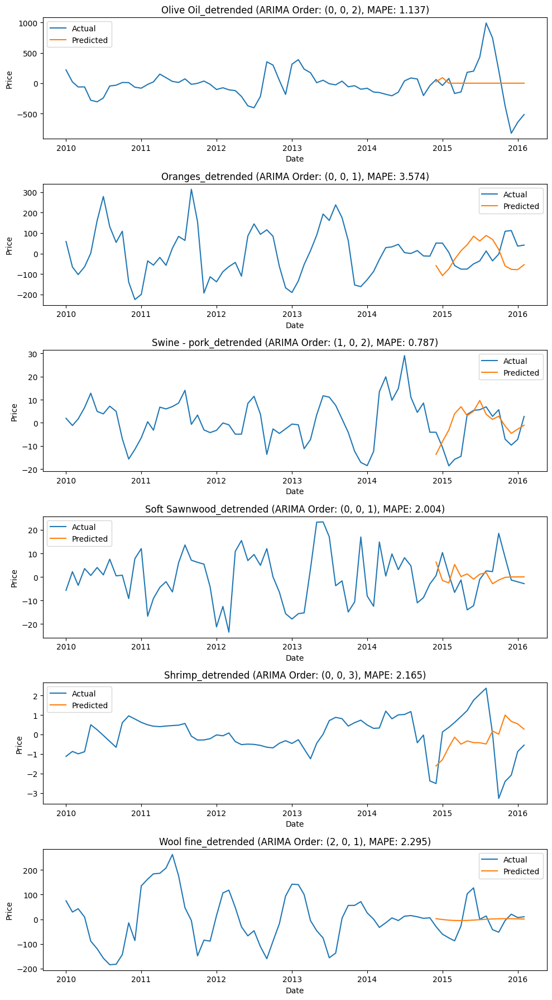

In [106]:
arima_model(detrended,'2010',seasonal = True, seasonal_period = 12)

In [186]:
import pmdarima as pm
from sklearn.metrics import mean_squared_error, mean_absolute_error


def arima_model2(data, year=None, seasonal=False, seasonal_period=12):
    if year is not None:
        data = data[data.index >= year]
    n_cols = len(data.columns)
    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_cols, 1, figsize=(10, 5 * n_cols))
    # Iterate over each column
    for i, column in enumerate(data.columns):
        ax = axs[i]
        # Perform train-test split
        train_data, test_data = train_test_split(data[column], test_size=0.2, shuffle=False)
        
        # Determine the order of ARIMA using auto_arima
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore")
            if seasonal:
                #model_order = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, trace=True, error_action='ignore').order
                seasonal_order_candidates = [(2, 1, 0,seasonal_period), (1, 1, 0,seasonal_period), (2, 0, 0,seasonal_period)]
                best_order = None
                best_aic = float('inf')
                for order in seasonal_order_candidates:
                    model = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, order=(0, 0, 0), seasonal_order=order, trace=True, error_action='ignore')
                    model_order= model.order
                    seasonal_order = model.seasonal
                    if model.aic() < best_aic:
                        best_aic = model.aic()
                        best_order = order
                seasonal_order = best_order if best_order in seasonal_order_candidates else None
            else:
                model_order = auto_arima(train_data).order
                seasonal_order = None

        # Fit ARIMA model
        if seasonal:
            model = SARIMAX(train_data, order=model_order, seasonal_order=seasonal_order)
        else:
            model = ARIMA(train_data, order=model_order)
        model_fit = model.fit()

        # Predict on test data
        y_pred = model_fit.forecast(len(test_data))

        # Compute MAPE
        rmse = np.sqrt(mean_squared_error(test_data, y_pred))
        mae = mean_absolute_error(test_data, y_pred)
        
        
        # Plot actual and predicted data
        ax.plot(data.index, data[column], label='Actual')
        ax.plot(test_data.index, y_pred, label='Predicted')

        ax.set_title(f'{column} \n ARIMA Order: {model_order, seasonal_order}, RMSE: {rmse:.2f} MAE: {mae:.2d}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Price')
        ax.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()


In [193]:

def arima_model2(data, year=None, seasonal=False, seasonal_period=12):
    if year is not None:
        data = data[data.index >= year]
    n_cols = len(data.columns)
    # Create a figure and axis objects for the subplots
    fig, axs = plt.subplots(n_cols, 1, figsize=(10, 5 * n_cols))
    # Iterate over each column
    for i, column in enumerate(data.columns):
        ax = axs[i]
        # Perform train-test split
        train_data, test_data = train_test_split(data[column], test_size=0.2, shuffle=False)
        
        # Determine the order of ARIMA using auto_arima
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore")
            if seasonal:
                model_order = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, trace=True, error_action='ignore').order
                seasonal_order = pm.auto_arima(train_data, seasonal=True, m=seasonal_period, trace=True, error_action='ignore').seasonal_order
            else:
                model_order = auto_arima(train_data).order
                seasonal_order = None

        # Fit ARIMA model
        if seasonal:
            model = SARIMAX(train_data, order=model_order, seasonal_order=seasonal_order)
        else:
            model = ARIMA(train_data, order=model_order)
        model_fit = model.fit()

        # Predict on test data
        y_pred = model_fit.forecast(len(test_data))

        rmse = np.sqrt(mean_squared_error(test_data, y_pred))
        mae = mean_absolute_error(test_data, y_pred)
        
        # Plot actual and predicted data
        ax.plot(data.index, data[column], label='Actual')
        ax.plot(test_data.index, y_pred, label='Predicted')

        ax.set_title(f'{column} \n Best ARIMA Order: {model_order}, {seasonal_order}, RMSE: {rmse:.2f} MAE: {mae:.2f}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Price')
        ax.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=818.551, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=730.178, Time=1.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=816.566, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=786.861, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=718.522, Time=1.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=765.987, Time=3.17 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=695.572, Time=2.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=713.659, Time=1.70 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.97 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=696.283, Time=

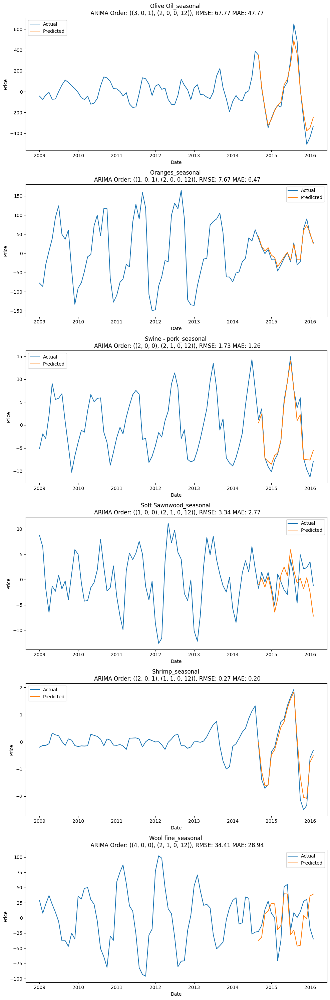

In [194]:
arima_model2(seas_comp,'2009',seasonal = True, seasonal_period = 12)